# CS4487 - Machine Learning
# Lecture 8 - Non-Linear Dimensionality Reduction, Manifold Embedding
## Dr. Antoni B. Chan
### Dept. of Computer Science, City University of Hong Kong

In [1]:
# setup
%matplotlib inline
import IPython.core.display         # setup output image format (Chrome works best)
IPython.core.display.set_matplotlib_formats("svg")
import matplotlib.pyplot as plt
import matplotlib
from numpy import *
from sklearn import *
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D

rbow = plt.get_cmap('rainbow')

/anaconda3/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/anaconda3/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/anaconda3/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/anaconda3/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/anaconda3/lib/python3.5/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV itera

# Outline
1. Non-Linear Dimensionality Reduction
    1. Kernel Principal Component Analysis (KPCA)  
2. **Manifold Embedding**
    1. Locally-linear embedding (LLE)
    2. Multi-dimensional Scaling (MDS)
    3. Isometric Mapping (Isomap)
    4. Spectral Embedding (Laplacian Eigenmaps)
    5. t-distributed Stochastic Neighbor Embedding (t-SNE)

# Manifold Embedding
- Reduce high-dimensional data to 2 or 3 dimensions for visualization
- Try to preserve the inherent structure of the data
  - find a set of lower-dim points that optimize some criteria.
- Two types:
  - 1) preserve local neighborhood structure
    - assumes thata lies in a lower-dim manifold; unfold the manifold
  - 2) preserve pairwise distances (similarities) between points
<img src="imgs/manifold.jpg" width=700>

# Locally-linear Embedding (LLE)
- **Idea:** preserve linearity within local neighborhoods defined by $K$ nearest neighbors.
  - 1) a point $\mathbf{x}_i$ can be reconstructed by a linear combination of its neighbors $N_i$.
    - find the weights for the best reconstruction
      - $W^* = \mathop{\mathrm{argmin}}_W \sum_i \|\mathbf{x}_i - \sum_{j\in N_i}w_{i,j}\mathbf{x}_j\|^2 $
  - 2) the embedded point $\mathbf{y}_i$ should also have the same local linearity.
    - find the embedded points that best preserve the linearity
      - $Y^* = \mathop{\mathrm{argmin}}_Y \sum_i \| \mathbf{y}_i - \sum_{j\in N_i}w_{i,j} \mathbf{y}_j\|^2$

# LLE
<center>
<img src="imgs/lle.jpg" width=600>
</center>

In [2]:
def plot_manifolds(X, Y, Xrs, titles=None, spwidth=2):
# X - original points
# Y - colors
# Xrs - manifold points (list of manifolds)
    numX = len(Xrs)

    if titles==None:
        titles = []
        for i in range(numX):
            titles.append("manifold" + str(i+1)) 
    
    sx = spwidth
    sy = ceil((numX+1)/float(spwidth))
    
    fig = plt.gcf()
    
    ax = fig.add_subplot(100*sy+10*sx+1, projection='3d')
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=Y, cmap=plt.cm.Spectral, edgecolors='k')
    ax.view_init(15, -80)
    ax.set_title("Original data")
    
    for i in range(numX):   
        Xr = Xrs[i]
        ax = fig.add_subplot(100*sy+10*sx+i+2)
        ax.scatter(Xr[:, 0], Xr[:, 1], c=Y, cmap=plt.cm.Spectral, edgecolors='k')
        plt.title(titles[i]); plt.grid()

In [3]:
IPython.core.display.set_matplotlib_formats("retina") # switch to png
Xswiss, Yswiss = datasets.samples_generator.make_swiss_roll(n_samples=1500, random_state=111)
X = Xswiss
Y = Yswiss

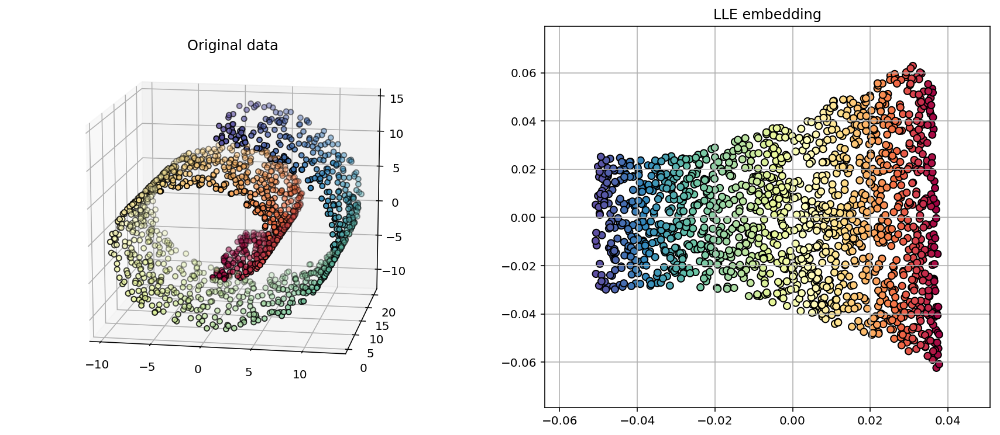

In [4]:
# n_neighbors = number of nearest neighbors to use for local neighborhood
# n_components = number of dimensions of manifold embedding
lle = manifold.LocallyLinearEmbedding(n_neighbors=12, n_components=2, random_state=121, n_jobs=-1)
Xr = lle.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["LLE embedding"])

In [5]:
Xr_all = []
titles_all = []
Xr_all.append(Xr)
titles_all.append("LLE")

- Sensitive to the number of neighbors for defining the local region.

In [6]:
Xrs = []
titles = []
for i,nn in enumerate([5, 10, 15, 50, 100]):
    lle = manifold.LocallyLinearEmbedding(n_neighbors=nn, n_components=2, random_state=121, n_jobs=-1)
    Xr = lle.fit_transform(X)
    Xrs.append(Xr)
    titles.append("LLE (nn=%d)" % (nn,))

lfig = plt.figure(figsize=(14,16))
plot_manifolds(X, Y, Xrs, titles)
plt.close()

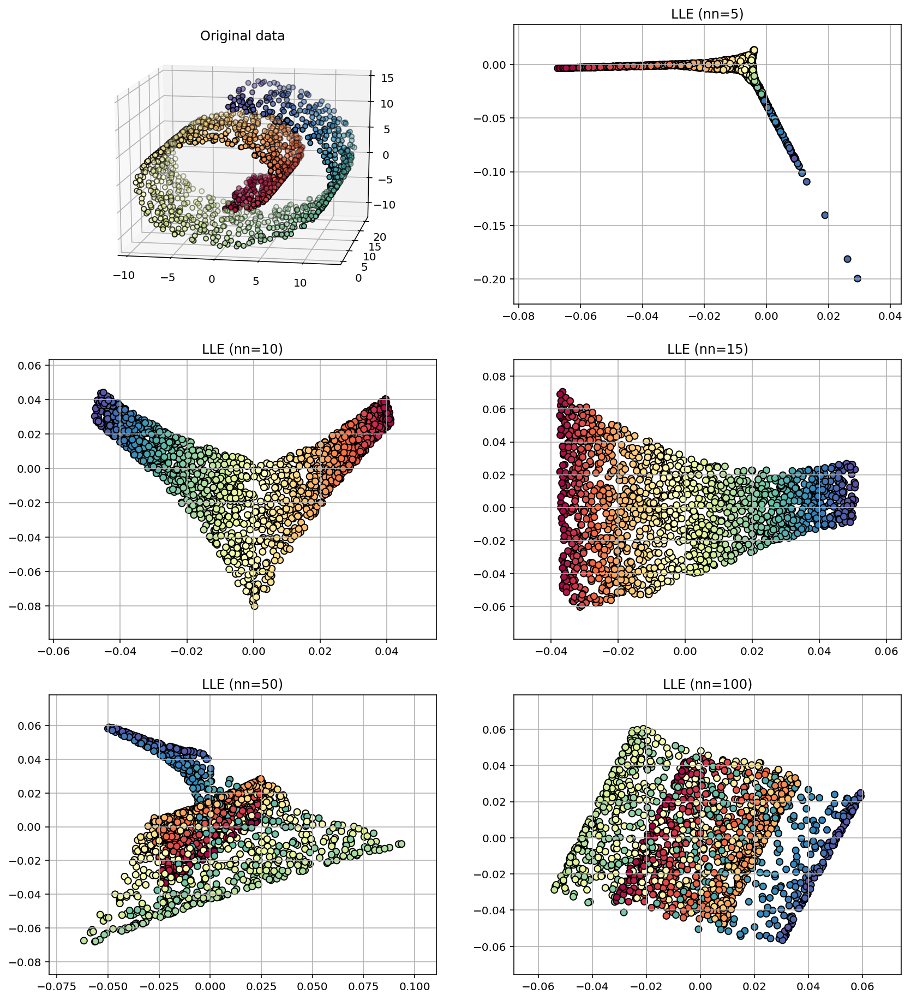

In [7]:
lfig

# Variants of LLE
- **Hessian LLE (HLLE)**: LLE that also uses local curvature information

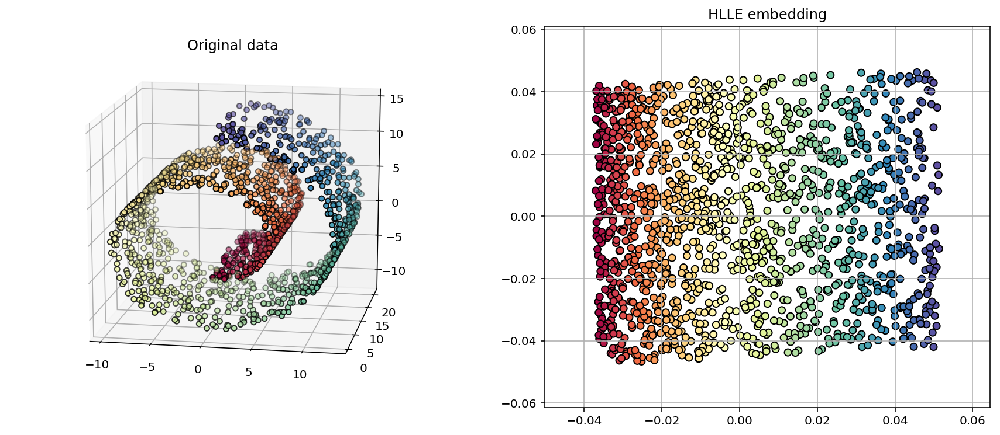

In [8]:
# set method to 'hessian'
hlle = manifold.LocallyLinearEmbedding(method='hessian', n_neighbors=12, n_components=2, random_state=121, n_jobs=-1)
Xr = hlle.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["HLLE embedding"])

In [9]:
Xr_all.append(Xr)
titles_all.append("HLLE")

- **Local tangent space alignment (LTSA)**: rather than preserve distances, align local tangent spaces of the neighborhoods.

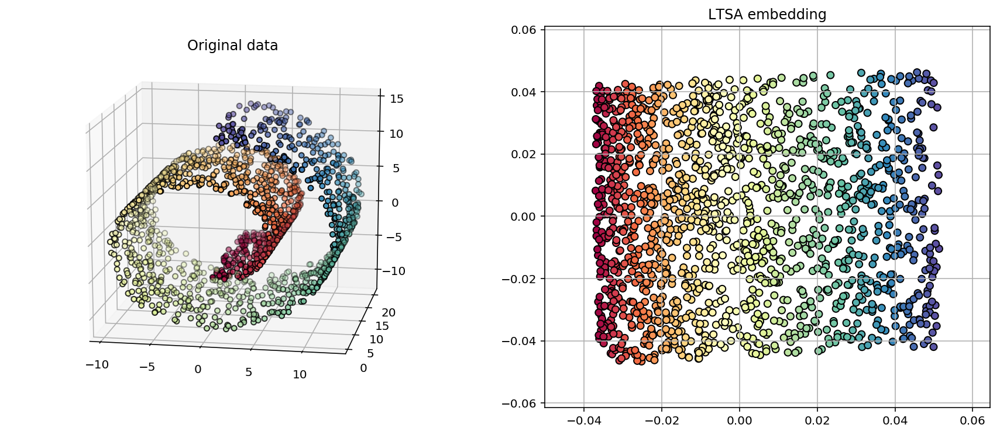

In [10]:
# set method to 'ltsa'
ltsa = manifold.LocallyLinearEmbedding(method='ltsa', n_neighbors=12, n_components=2, random_state=121, n_jobs=-1)
Xr = ltsa.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["LTSA embedding"])

In [11]:
Xr_all.append(Xr)
titles_all.append("LTSA")

# Multidimensional Scaling
- **Idea:** find a low-dimensional embedding that preserves the pairwise distances between points in original high-dim space.
  - $Y^* = \mathop{\mathrm{argmin}}_Y \sum_{i,j} (d(\mathbf{x}_i,\mathbf{x}_j) - d(\mathbf{y}_i,\mathbf{y}_j)))^2$
    - $\mathbf{x}_i$ are points in original space
    - $\mathbf{y}_i$ are points in the embedding space

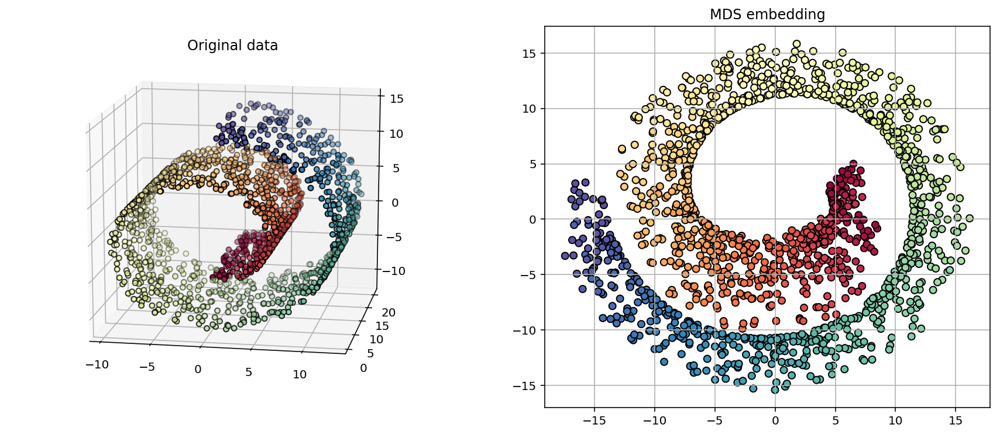

In [12]:
mds = manifold.MDS(n_components=2, random_state=1234, n_jobs=-1)
Xr = mds.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["MDS embedding"])

- **Problem**
  - MDS tries to preserve the Euclidean distance between the points.
  - For a manifold, two points may be far away along the manifold (geodesic distance), but close in Euclidean distance.
    - dashed line = Euclidean distance
    - solid line = Geodesic distance
<center><img src="imgs/geod.png" width=500></center>

# Isomap (Isometric Mapping)
- Find embedding that preserves geodesic distances between points
  - geodesic distance = distances moving on the manifold (figure **A**)
- Approximate manifold by forming a graph (figure **B**)
  - each data point is a node
  - edge is added between nodes if they are $K$-nearest-neighbors.
  - calculate geodesic distance between 2 points using shortest-paths algorithm (Dijkstra’s algorithm).
- Use MDS on the geodesic distances to calculate the embedding (figure **C**).
<center><img src="imgs/isomap1.png"></center>

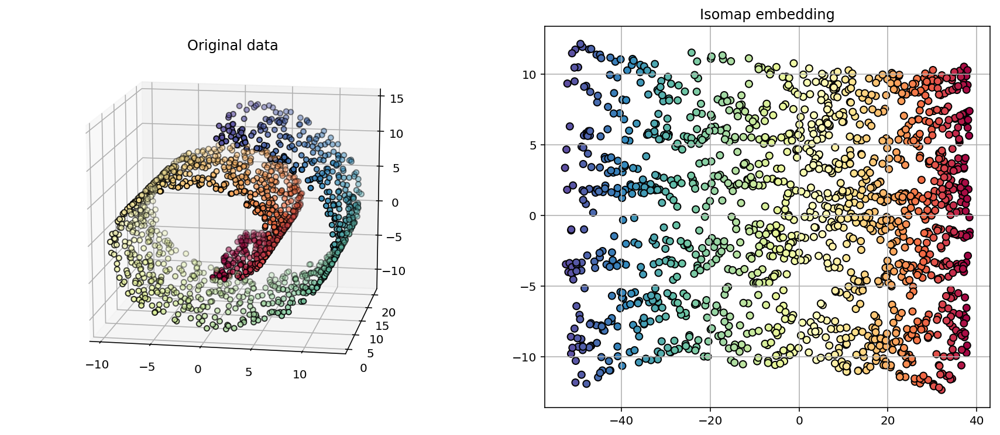

In [13]:
iso = manifold.Isomap(n_neighbors=12, n_components=2, n_jobs=-1)
Xr = iso.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["Isomap embedding"])

In [14]:
Xr_all.append(Xr)
titles_all.append("Isomap")

- Sensitive to number of neighbors
  - too few neighbors will put "holes" in the manifold

In [15]:
Xrs = []
titles = []
for i,nn in enumerate([5, 10, 15]):
    iso = manifold.Isomap(n_neighbors=nn, n_components=2, n_jobs=-1)
    Xr = iso.fit_transform(X)
    Xrs.append(Xr)
    titles.append("Isomap (nn=%d)" % (nn,))

ifig = plt.figure(figsize=(14,10))
plot_manifolds(X, Y, Xrs, titles)
plt.close()

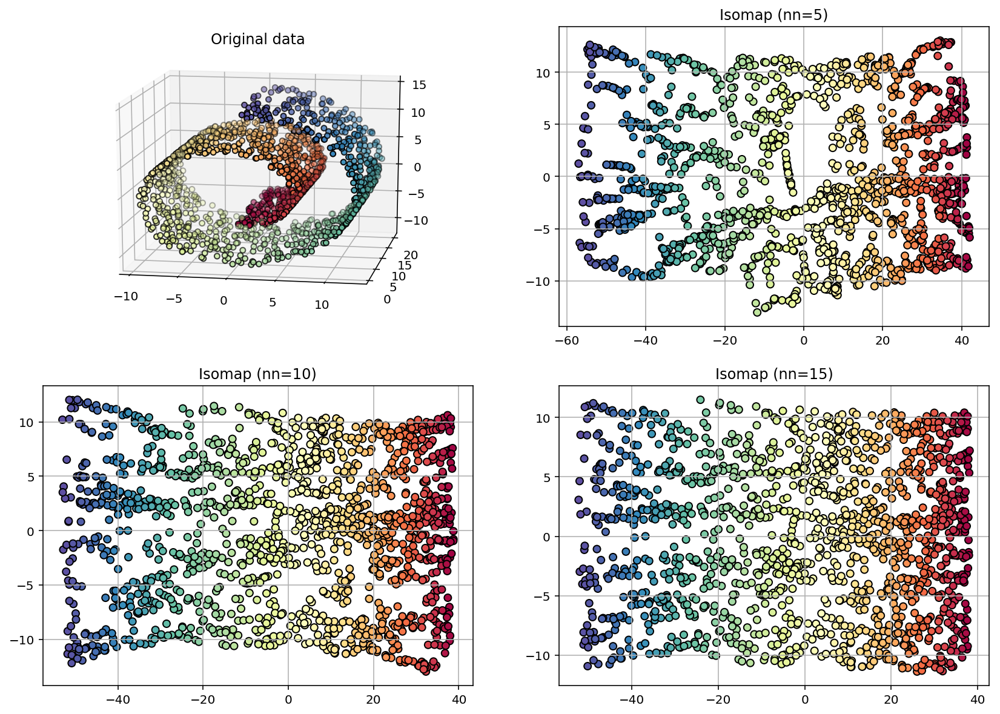

In [16]:
ifig

# Spectral Embedding (Laplacian Eigenmaps)
- Preserve the neighborhood structure
  - 1) form an affinity (adjacency) matrix $W$
    - using $K$ nearest neighbors
      - $W_{i,j} = \begin{cases} 1, & \text{$\mathbf{x}_i$ and $\mathbf{x}_j$ are neighbors} \\ 0, & \text{they are not neighbors}\end{cases}$.
    - using RBF kernel
      - $k(\mathbf{x}_i, \mathbf{x}_j)$ represents how close a neighbor.
  - 2) keep neighboring points close together in the embedding.
    - penalize embedding points that are far apart, but should be neighbors
      - $Y^* = \mathop{\mathrm{argmin}}_Y \sum_{i,j} W_{i,j} (y_i - y_j)^2$

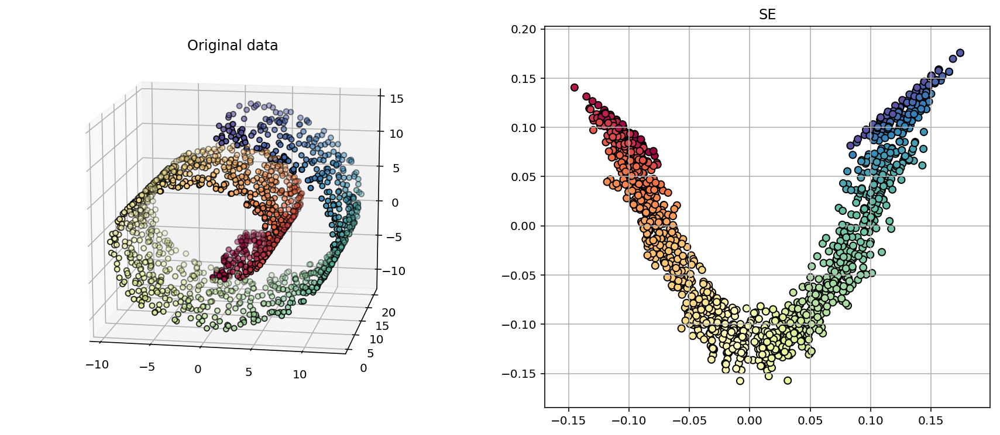

In [17]:
# using nearest-neighbors for affinity
spe = manifold.SpectralEmbedding(n_components=2, affinity='nearest_neighbors', 
                                 random_state=1234, n_neighbors=12, n_jobs=-1)
Xr = spe.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["SE"])

In [18]:
Xr_all.append(Xr)
titles_all.append("SE")

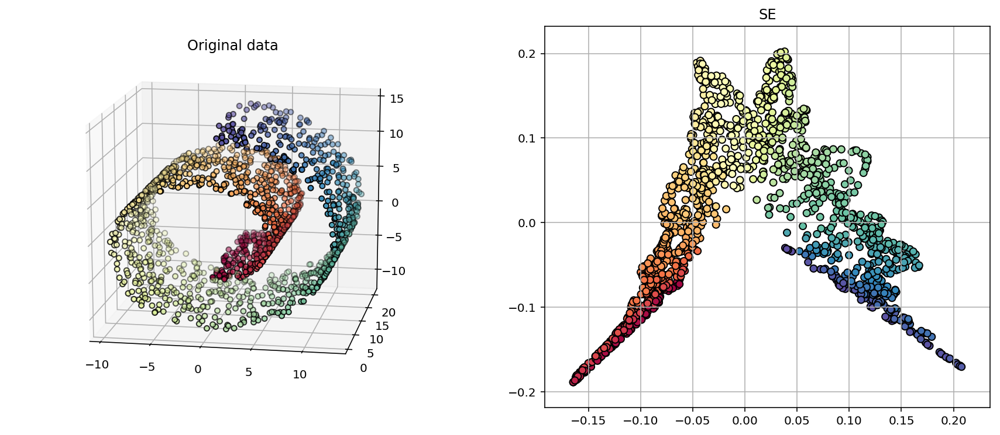

In [19]:
# using RBF kernel for affinity
# gamma is the inverse bandwidth
spe = manifold.SpectralEmbedding(n_components=2, affinity='rbf', 
                                 gamma=0.2, random_state=1234)
Xr = spe.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["SE"])

In [20]:
Xr_all.append(Xr)
titles_all.append("MDS")

# t-Distributed Stochastic Neighbor Embedding (t-SNE)
- Preserve pairwise similarities
  - 1) treat similarities in original space as probabilities
    - the probability that $j$ is a neighbor of $i$: $p_{j|i} = \frac{k_i(\mathbf{x}_i,\mathbf{x_j})}{\sum_{k\neq i} k_i(\mathbf{x}_i, \mathbf{x}_k)}$
      - $k_i(\mathbf{x}_i,\mathbf{x}_j)$ is the RBF kernel with inverse bandwidth $\gamma_i$.
    - the similarity between $i$ and $j$: $p_{i,j} = \frac{p_{j|i} + p_{i|j}}{2N}$
  - 2) similarities in the embedding space (student-t distribution)
    - the probability that $i$ and $j$ are neighbors: $q_{i,j} = \frac{(1 + \|\mathbf{y}_i - \mathbf{y_j}\|^2)^{-1}}{\sum_{k\neq l}(1 + \|\mathbf{y}_l - \mathbf{y_k}\|^2)^{-1}}$
  - 3) find the embedding points that preserve the probability structure:
    - $Y = \mathop{\mathrm{argmin}}_Y \sum_{i\neq j} p_{i,j} \log \frac{p_{i,j}}{q_{i,j}}$
    - the objective is the Kullback-Leibler (KL) divergence, which is a measure of similarity between two probability distributions.

- Tends to group together similar items
  - student-t distribution is heavy-tailed
  - "moderate" distances in original space are converted to "large" distances in embedding space

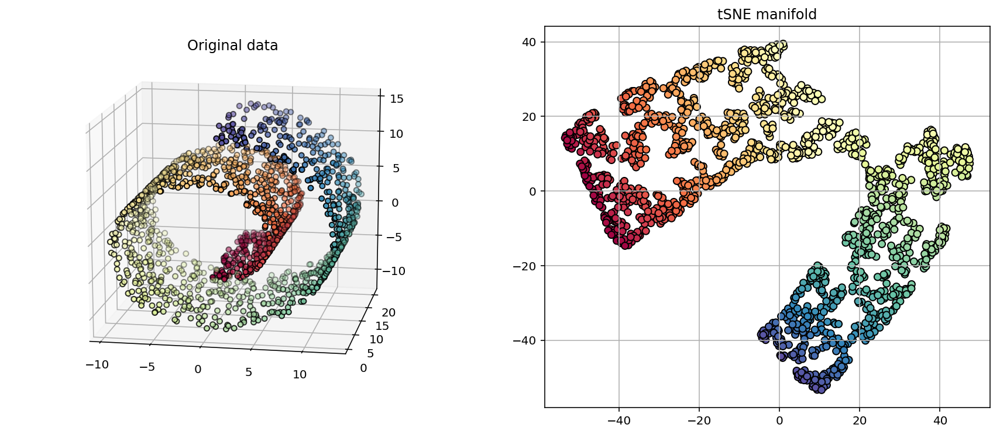

In [21]:
# perplexity = similar to number of neighbors
tsne = manifold.TSNE(n_components=2, perplexity=30.0, random_state=11)
Xr = tsne.fit_transform(X)

plt.figure(figsize=(15,6))
plot_manifolds(X, Y, [Xr], ["tSNE manifold"])

In [22]:
Xr_all.append(Xr)
titles_all.append("tSNE")

- The `perplexity` parameter controls the number of groups (size of groups).
  - small perplexity: form more groups
  - large perplexity: form less groups

In [23]:
Xrs = []
titles = []
# perplexity = similar to number of neighbors
for p in [5, 15, 30, 60, 100]:
    tsne = manifold.TSNE(n_components=2, perplexity=p, random_state=11)
    Xr = tsne.fit_transform(X)

    Xrs.append(Xr)
    titles.append('perplexity=%g' % p)
    
tsnefig = plt.figure(figsize=(14,14))
plot_manifolds(X, Y, Xrs, titles)
plt.close()

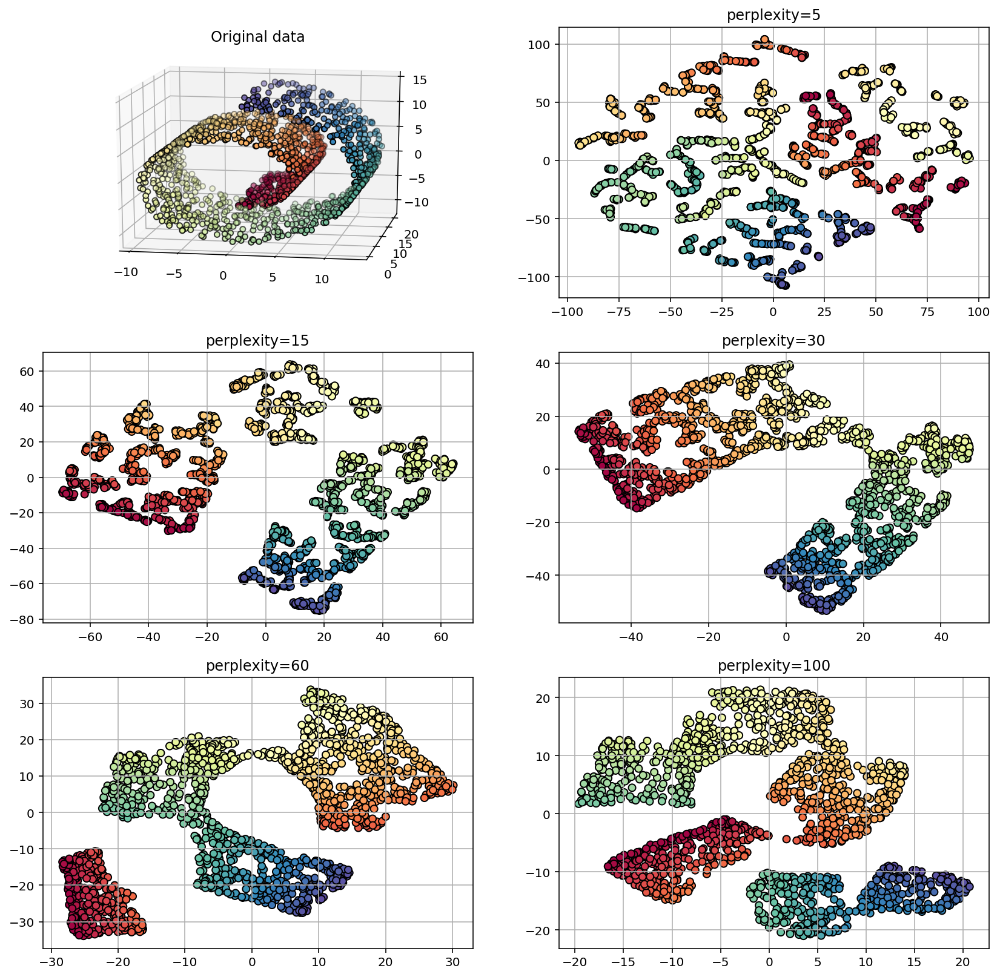

In [24]:
tsnefig

# Comparison of Methods
- Preserves local neighborhoods: LLE, HLLE, TLSA
- Preserves geodesic distance: Isomap, SE
- Preserves distances/similarities: MDS, t-SNE

In [25]:
fig = plt.figure(figsize=(18,12))
plot_manifolds(X, Y, Xr_all, titles_all, spwidth=4)
plt.close()

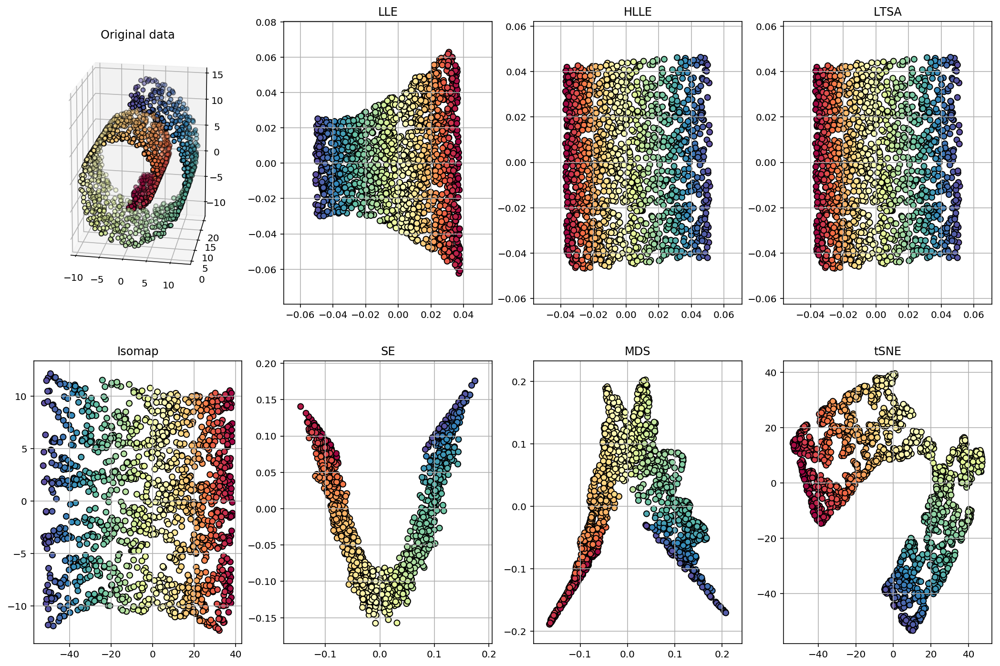

In [26]:
fig

# Digit Images
- Digits 0-5
- Embed 8x8 image (64D vector) into 2-dimensional space for visualization

In [27]:
digits = datasets.load_digits(n_class=6)
X = digits.data
y = digits.target
n_samples, n_features = X.shape
n_neighbors = 30

X_pca = decomposition.PCA(n_components=2).fit_transform(X)
X_iso = manifold.Isomap(n_neighbors, n_components=2, n_jobs=-1).fit_transform(X)
X_mds = manifold.MDS(n_components=2, n_init=1, max_iter=100, n_jobs=-1).fit_transform(X)
X_se = manifold.SpectralEmbedding(n_components=2, random_state=0, eigen_solver="arpack", n_jobs=-1).fit_transform(X)
X_tsne = manifold.TSNE(n_components=2, init='pca', random_state=0).fit_transform(X)

In [28]:
X_lle = manifold.LocallyLinearEmbedding(30, n_components=2, n_jobs=-1).fit_transform(X)
#X_hlle = manifold.LocallyLinearEmbedding(n_neighbors, n_components=2, method='hessian').fit_transform(X)
#X_ltsa = manifold.LocallyLinearEmbedding(n_neighbors, n_components=2, method='ltsa').fit_transform(X)

In [29]:
def plot_embedding(X, y, title=None):
    x_min, x_max = amin(X, 0), amax(X, 0)
    X = (X - x_min) / (x_max - x_min)
    ax = plt.gca()
    for i in range(X.shape[0]):
        plt.text(X[i, 0], X[i, 1], str(digits.target[i]),
                 color=plt.cm.Set1(y[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 7})

    if hasattr(matplotlib.offsetbox, 'AnnotationBbox'):
        # only print thumbnails with matplotlib > 1.0
        shown_images = array([[1., 1.]])  # just something big
        for i in range(digits.data.shape[0]):
            dist = sum((X[i] - shown_images) ** 2, 1)
            if min(dist) < 4e-3:
                # don't show points that are too close
                continue
            shown_images = r_[shown_images, [X[i]]]
            imagebox = matplotlib.offsetbox.AnnotationBbox(
                matplotlib.offsetbox.OffsetImage(digits.images[i], 
                    zoom=2., 
                    cmap=plt.cm.gray_r), X[i], pad=0.02)
            imagebox.patch.set_edgecolor(plt.cm.Set1(y[i] / 10.))
            imagebox.patch.set_linewidth(2)
            ax.add_artist(imagebox)
    plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title)

Xall = [X_pca, X_lle, X_mds, X_iso, X_se, X_tsne]
titlesall = ["PCA", "LLE", "MDS", "Isomap", "SE", "tSNE"]
dfig = plt.figure(figsize=(18,30))
for i,XX in enumerate(Xall):
    plt.subplot(3,2,i+1)
    plot_embedding(XX, y, titlesall[i])
plt.close()

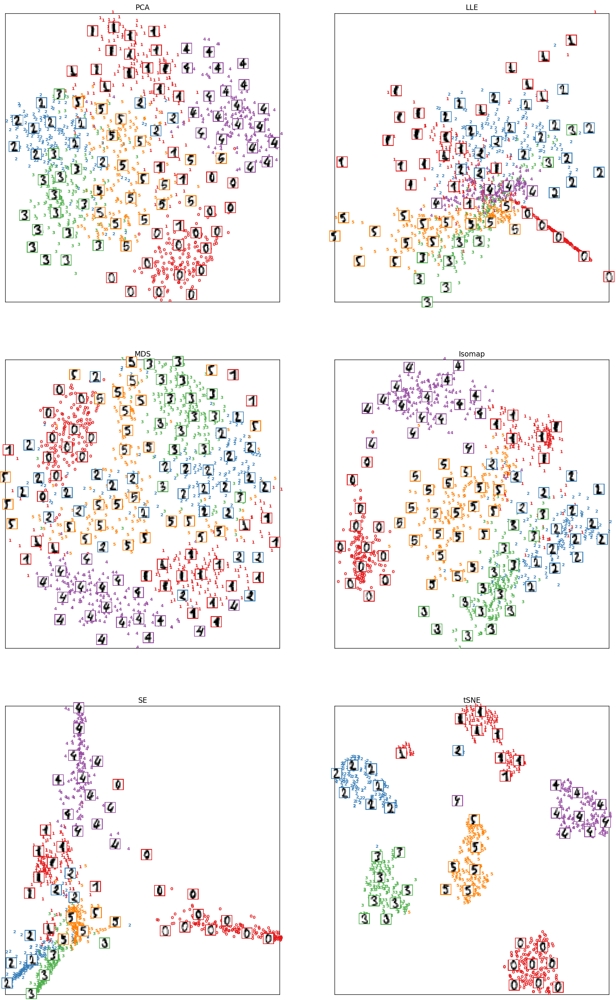

In [30]:
dfig

# Non-Linear Dimensionality Reduction - Summary
- **Goal:** given high-dim data, find a low-dim representation.
  - try to preserve inherent structure of data
- Two types of approaches:
  - _Non-linear dimensionality reduction_
    - calculate low-dim coefficients using non-linear projections (kernel).
  - _Manifold embedding_
    - Optimize over the embedding (low-dim) points to preserve some property from the high-dim points.
    - After training, manifold embedding methods cannot transform a novel (new) point.
  
<table style="font-size:9pt;">
<tr>
<th>Name</th>
<th>Objective</th>
<th>Advantages</th>
<th>Disadvantages</th>
</tr>
<tr>
<td>Kernel principal component analysis (KPCA)</td>
<td>PCA in high-dim feature space (kernel trick)</td>
<td>- can transform novel data</td>
<td>- need to calculate kernel matrix;<br>- need to keep training data around for embedding new points.</td>
</tr>
<tr>
<td>Locally-Linear Embedding (LLE)</td>
<td>preserve local neighborhood distances</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Hessian LLE</td>
<td>w/ local curvature information.</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Local tangent space alignment (LTSA)</td>
<td>align tangent spaces</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Multi-dimensional scaling (MDS)</td>
<td>preserve pairwise distances</td>
<td>- good for viewing the space.</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Isometric mapping (Isomap)</td>
<td>preserve geodesic distances</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>Spectral embedding (SE)</td>
<td>"PCA" on graph representation</td>
<td>- good for single low-dim manifold</td>
<td>- cannot embed a novel point.</td>
</tr>
<tr>
<td>t-distributed Stochastic Neighbor Embedding (t-SNE)</td>
<td>preserve pairwise similarities</td>
<td>- can discover similar items</td>
<td>- cannot embed a novel point.</td>
</tr>
</table>